In [1]:
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from astropy.io import fits
from astropy.table import Table
from astropy.coordinates.sky_coordinate import SkyCoord
import astropy.units as u
import seaborn as sns
import altair as alt
import plotly.graph_objects as go
import plotly.express as px
from scipy.stats import gaussian_kde

# Overview of Milky Way Metllicity Trends

In [2]:
df = pd.read_csv('Apogee.csv')
sample = df.sample(n=5000)

# for stellar streams plotting
original_sample = df
stellar_stream_sample = df.sample(n=7000)

## Visualize Positionality in Relation to Earth

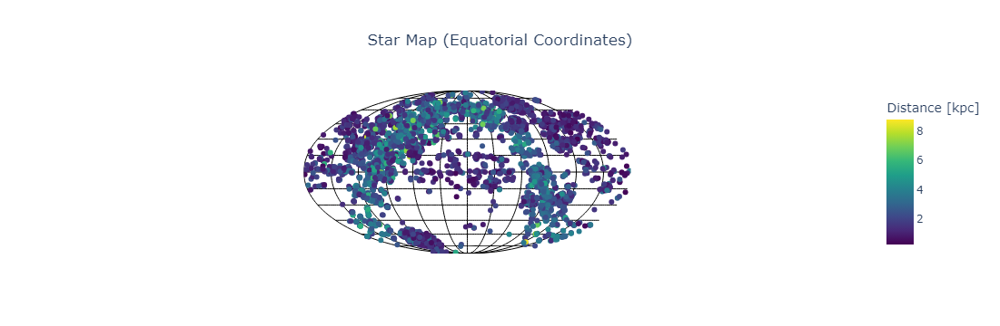

In [3]:
# These are the values we will need to create the SkyCoord object
sample[['RA', 'DEC', 'DISTANCE']].describe()

coords = SkyCoord(
   ra=sample['RA'].values*u.degree,
   dec=sample['DEC'].values*u.degree,
   distance=sample['DISTANCE']*u.kpc,
   frame='icrs'
)

# Prepare data for Plotly
data = {
    'RA': -coords.ra.wrap_at(180 * u.deg).deg,  # Negative to match Aitoff projection in matplotlib
    'DEC': coords.dec.deg,
    'Distance': coords.distance.value
}

df = pd.DataFrame(data)

# Interactive plot with Plotly Express using an Aitoff projection-like view
fig = px.scatter_geo(
    df,
    lon='RA',
    lat='DEC',
    color='Distance',
    color_continuous_scale='Viridis',
    projection="mollweide",
    title="Star Map (Equatorial Coordinates)",

)

fig.update_geos(
    showcountries=False,
    showcoastlines=False,
    showland=False,
    showocean=False,
    showlakes=False,
    showframe=False,
    lonaxis=dict(
        showgrid=True,
        gridwidth=1,
        gridcolor='black',
        dtick=30
    ),
    lataxis=dict(
        showgrid=True,
        gridwidth=1,
        gridcolor='black',
        dtick=15
    )
)

fig.update_layout(
    coloraxis_colorbar=dict(title="Distance [kpc]"),
    title_x=0.5
)

fig.show()

## Metallicity Ratios viewed Edge on and Face on based on the Coordinate Plane

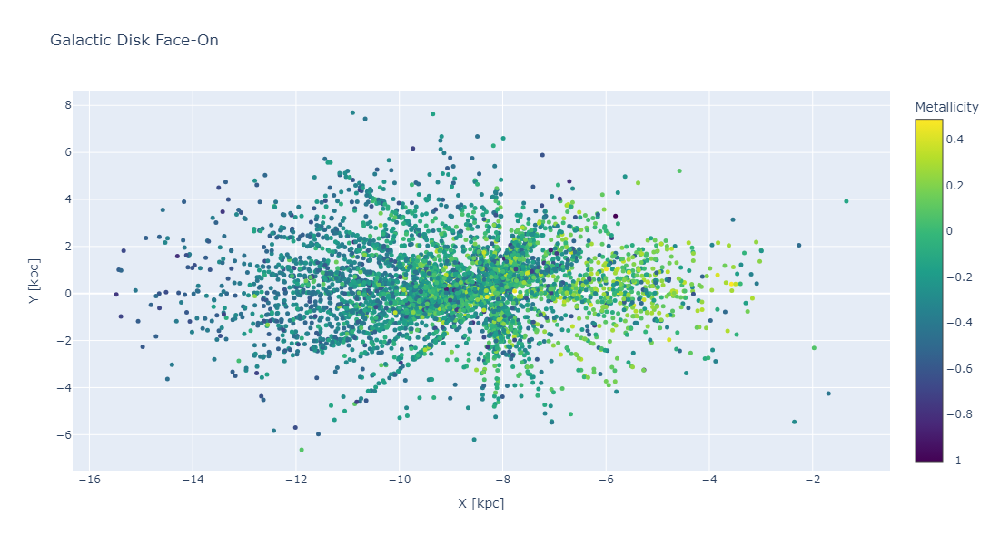

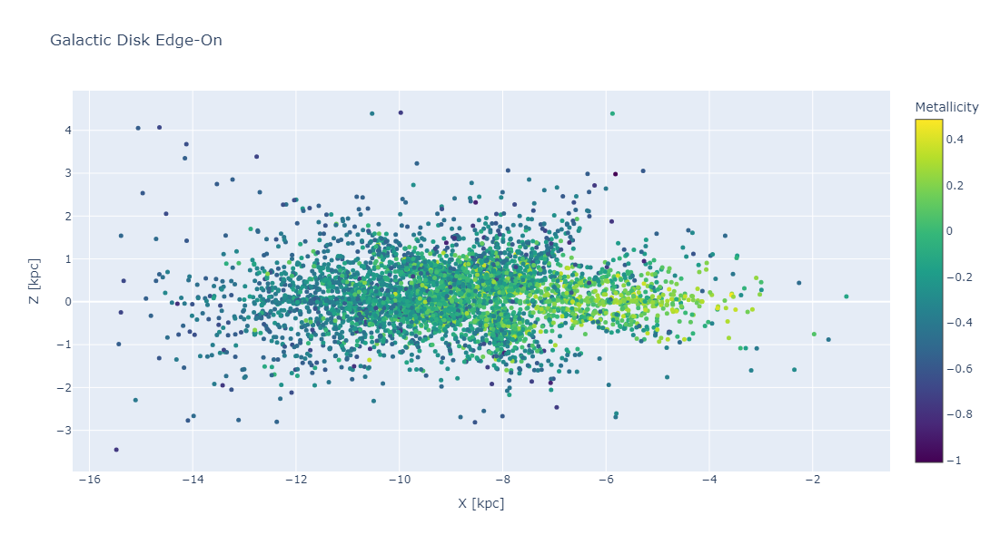

In [4]:
import plotly.graph_objects as go
import plotly.express as px
from scipy.stats import gaussian_kde

# Create the scatter plot of X vs Y axis of the Milky way with Metalicity as coloring (face on visual)
fig1 = go.Figure(data=go.Scatter(
    x=sample['X'],
    y=sample['Y'],
    mode='markers',
    marker=dict(
        size=5,
        color=sample['[Fe/H]'],  # Set color to the density
        colorscale='Viridis',  # Choose color scale
        showscale=True,  # Show color scale
        colorbar=dict(title='Metallicity')
    )
))

# Update layout
fig1.update_layout(title='Galactic Disk Face-On',
                  xaxis_title='X [kpc]',
                  yaxis_title='Y [kpc]', hovermode='closest', width = 600, height = 600)


# Create the scatter plot of X vs Z axis of the Milky way with Metalicity as coloring (edge on visual)
fig2 = go.Figure(data=go.Scatter(
    x=sample['X'],
    y=sample['Z'],
    mode='markers',
    marker=dict(
        size=5,
        color=sample['[Fe/H]'],  # Set color to the density
        colorscale='Viridis',  # Choose color scale
        showscale=True,  # Show color scale
        colorbar=dict(title='Metallicity')
    )
))

# Update layout
fig2.update_layout(title='Galactic Disk Edge-On',
                  xaxis_title='X [kpc]',
                  yaxis_title='Z [kpc]', hovermode='closest', width = 600, height = 600)

# Show the figure
fig1.show()
fig2.show()

In [5]:
# Select the columns you want to stack
columns_to_stack = ['[C/H]','[N/H]','[Na/H]','[Mg/H]','[S/H]','[Ca/H]','[Fe/H]']

# Stack the columns, create one column with metalicity ratio labels and another with all the values
df_stacked = sample.melt(id_vars=sample.columns.difference(columns_to_stack), 
                     value_vars=columns_to_stack, 
                     var_name='Metallicity_Ratio', 
                     value_name='Value')

# find the maximum metalicity for each star in the dataset
max_values = df_stacked.groupby('ID')['Value'].max().reset_index()

# create a dataset which has the max metalicity ratio, the name of the metalicity ratio (s/h, c/h, etc), and all existing data
# there is one instance per star
max_values.rename(columns={'Value': 'Max'}, inplace=True)
max = pd.merge(max_values, df_stacked, on = 'ID', how = 'outer')
max_only = max[max['Max'] == max['Value']][['ID', 'Metallicity_Ratio', 'Max']]
subset = pd.merge(sample, max_only, on = 'ID', how = 'inner')

In [6]:
bins = pd.cut(subset['R'], bins=5)

# Assign the range label for each bin
subset['R_group'] = bins.apply(lambda x: f"{x.left} - {x.right}")

## Count of Highest Metallicity Ratio per binned radius group

In [7]:
import altair as alt
import warnings
import pandas as pd

# Suppress all warnings
warnings.filterwarnings("ignore")

# Assuming 'subset' is your DataFrame containing the relevant data
# Extract the lower bound of R_group (assumed to be a string range like '0-10')
subset['R_group_lower'] = subset['R_group'].str.split('-').str[0].astype(float)

# Count occurrences of each Metallicity_Ratio per R_group
count_data = subset.groupby(['Metallicity_Ratio', 'R_group']).size().reset_index(name='count')

# Calculate the total count per R_group
count_data['total'] = count_data.groupby('R_group')['count'].transform('sum')

# Calculate the percentage
count_data['percentage'] = (count_data['count'] / count_data['total']) * 100

# Create the pie chart
chart = alt.Chart(count_data).mark_arc().encode(
    theta='count:Q',            # Size of the pie slice
    color='Metallicity_Ratio:N', # Color based on Metallicity_Ratio
    tooltip=[
        'Metallicity_Ratio:N',  # Show Metallicity_Ratio in tooltip
        'count:Q',               # Show count in tooltip
        'percentage:Q'           # Show percentage in tooltip
    ]
).facet(
    column=alt.Column('R_group:N', sort=alt.EncodingSortField(field='R_group_lower', op='min', order='ascending'))
).properties(
    title="Distribution of Metallicity Ratio by Radius Group"  # Add a title to the chart
).interactive()

# Display the chart
chart


alt.FacetChart(...)

## Highest Metallicity Ratio vs Radius graphed as a grouped scatterplot

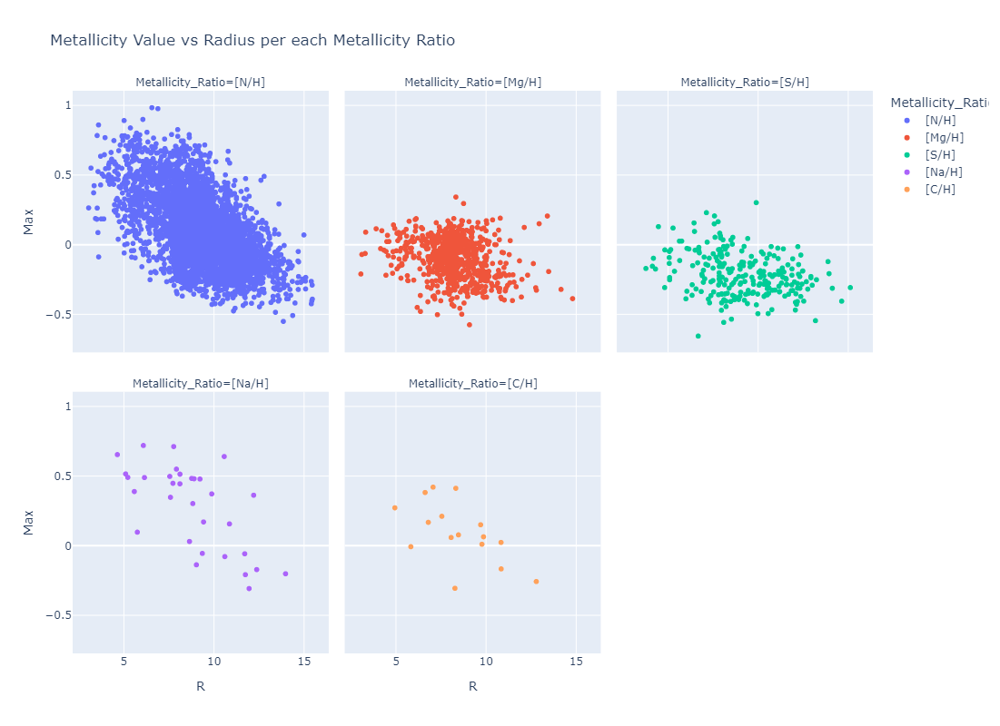

In [8]:
# Create a line of scatter plots using subplots
# visualize a faceted version of the previous graph
fig = px.scatter(subset, x='R', y='Max', color='Metallicity_Ratio', 
                 facet_col='Metallicity_Ratio', facet_col_wrap=3, 
                 title='Metallicity Value vs Radius per each Metallicity Ratio',
                 labels={'x': 'Radius', 'y': 'Metallicity'}, width=800, height=800)

# Show the figure
fig.show()

In [9]:
#### Full dataset presented showing metalicity ratio vs radius with the mean metalicity ratio per radius as slider

In [10]:
sample2 = sample.sample(714)
# Select the columns you want to stack
columns_to_stack = ['[C/H]','[N/H]','[Na/H]','[Mg/H]','[S/H]','[Ca/H]','[Fe/H]']

# Stack the columns, create one column with metalicity ratio labels and another with all the values
df_stacked2 = sample2.melt(id_vars=sample2.columns.difference(columns_to_stack), 
                     value_vars=columns_to_stack, 
                     var_name='Metallicity_Ratio', 
                     value_name='Value')
df_graph = df_stacked

## View of Mean Metalicity Ratios per Radius

In [11]:
import altair as alt
import pandas as pd

# Sample DataFrame for demonstration
# Make sure your DataFrame (subset) has the necessary columns: 'Max', 'Metalicity_ratio', 'Metalicity_Ratio', and 'R'.

# Create an interval selection for interaction
interval = alt.selection_interval()
base = alt.Chart(df_stacked2).mark_point().encode(y = 'Value', 
                                           color = alt.condition(interval, 'Metallicity_Ratio', alt.value('lightgray')), tooltip = 'Metallicity_Ratio').add_params(interval)

# try to ma
hist = alt.Chart(df_stacked2).mark_bar().encode(x = alt.Y('mean(Value)', scale=alt.Scale(domain=[-1, 1])), y = 'Metallicity_Ratio', color = 'Metallicity_Ratio').properties(width = 800, height = 80). transform_filter(interval)

scatter = base.encode(x = 'R') 

scatter & hist

alt.VConcatChart(...)

## Visualization of the metallicity of stellar streams at extreme Z-values

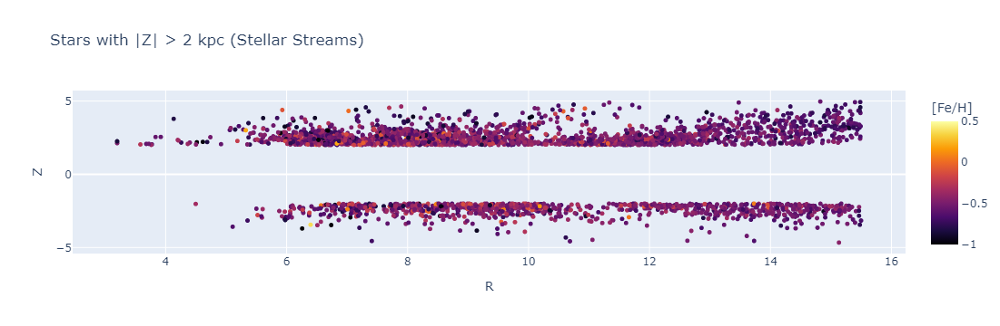

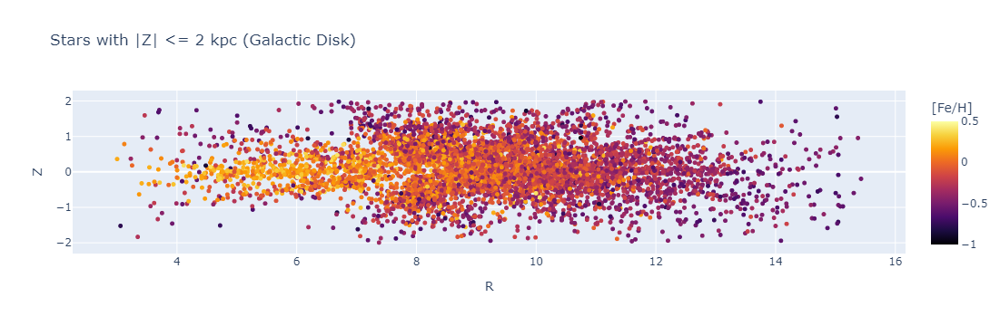

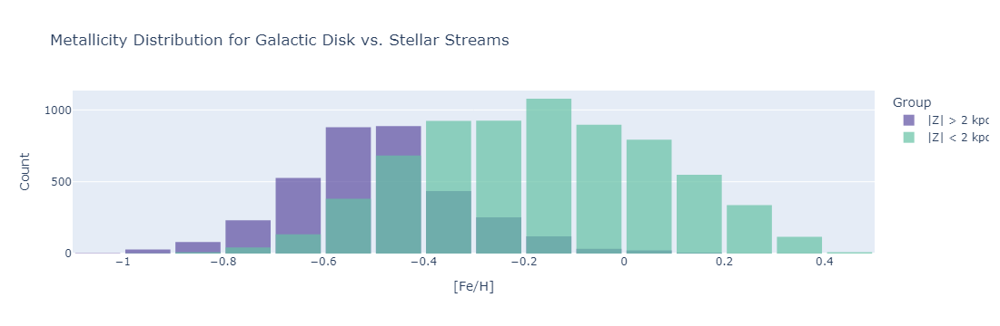

In [12]:
high_z = original_sample[(original_sample['Z'] > 2) | (original_sample['Z'] < -2)]
low_z = stellar_stream_sample[(stellar_stream_sample['Z'] <= 2) & (stellar_stream_sample['Z'] >= -2)]

# Create scatter plot for high Z values
fig_high_z = px.scatter(
    high_z,
    x='R',
    y='Z',
    color='[Fe/H]',
    color_continuous_scale='Inferno',
    range_color=[-1, 0.5],
    title='Stars with |Z| > 2 kpc (Stellar Streams)'
).update_traces(marker=dict(size=5))

# Create scatter plot for low Z values
fig_low_z = px.scatter(
    low_z,
    x='R',
    y='Z',
    color='[Fe/H]',
    color_continuous_scale='Inferno',
    range_color=[-1, 0.5],
    title='Stars with |Z| <= 2 kpc (Galactic Disk)'
).update_traces(marker=dict(size=5))

# Create a histogram for [Fe/H] values, with high and low Z groups
fig_histogram = go.Figure()
fig_histogram.add_trace(go.Histogram(
    x=high_z['[Fe/H]'],
    name='|Z| > 2 kpc',
    marker_color='#5e4fa2',
    opacity=0.7,
    nbinsx=20,  # Reduce the number of bins
    hovertemplate=' Stellar Streams<br>[Fe/H]: %{x}<extra></extra>'  # Custom hover text
))
fig_histogram.add_trace(go.Histogram(
    x=low_z['[Fe/H]'],
    name='|Z| < 2 kpc',
    marker_color='#66c2a5',
    opacity=0.7,
    nbinsx=20,  # Reduce the number of bins
    hovertemplate=' Galactic Disk<br>[Fe/H]: %{x}<extra></extra>'  # Custom hover text
))

# Update the layout for the histogram
fig_histogram.update_layout(
    title='Metallicity Distribution for Galactic Disk vs. Stellar Streams',
    xaxis_title='[Fe/H]',
    yaxis_title='Count',
    barmode='overlay',  # Use 'overlay' for overlapping bars or 'group' for side-by-side bars
    bargap=0.1,
    legend_title='Group'
)

# Show the plots
fig_high_z.show()
fig_low_z.show()
fig_histogram.show()